<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/6cat_val_NASNetLarge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer learning and fine-tuning MASNetLarge

In [ ]:
# Ejecutar con TPU, Con GPU da error de memória

import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
try:
  tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
  # Invalid device or cannot modify virtual devices once initialized.
  pass

In [ ]:
FOLDER = '6cat_val'
!wget "http://mmoviles.upv.es/mascarillas/{FOLDER}.zip"
!unzip -qq -n {FOLDER}.zip

--2021-06-16 19:56:24--  http://mmoviles.upv.es/mascarillas/6cat_val.zip
Resolving mmoviles.upv.es (mmoviles.upv.es)... 158.42.250.56
Connecting to mmoviles.upv.es (mmoviles.upv.es)|158.42.250.56|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31735949 (30M) [application/zip]
Saving to: ‘6cat_val.zip.2’

6cat_val.zip.2      100%[===================>]  30.27M  4.49MB/s    in 7.9s    

2021-06-16 19:56:32 (3.84 MB/s) - ‘6cat_val.zip.2’ saved [31735949/31735949]



In [ ]:
from keras_preprocessing.image import ImageDataGenerator

BATCH_SIZE = 33
IMG_SIZE = (331, 331)

training_datagen = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=5,
      horizontal_flip=True)      
train_generator = training_datagen.flow_from_directory(
	   FOLDER+'/training',
     batch_size=BATCH_SIZE,
     seed=9,
	   target_size=IMG_SIZE)

validation_datagen = ImageDataGenerator(
      rescale = 1./255)
validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+'/validation/',
    batch_size=BATCH_SIZE,
	  target_size=IMG_SIZE,
    shuffle=False,
    seed=9) 

Found 1000 images belonging to 6 classes.
Found 194 images belonging to 6 classes.


In [ ]:
from tensorflow import keras

base_model = keras.applications.NASNetLarge(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=IMG_SIZE+(3,),
    include_top=False, # Do not include the ImageNet classifier at the top.
)  
base_model.trainable = False # Freeze the base_model

inputs = keras.Input(shape=IMG_SIZE+(3,))
x = inputs
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dense(512)(x)
x = keras.layers.Dropout(0.2)(x) 
outputs = keras.layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 331, 331, 3)]     0         
_________________________________________________________________
NASNet (Functional)          (None, 11, 11, 4032)      84916818  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 4032)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               2064896   
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 3078      
Total params: 86,984,792
Trainable params: 2,067,974
Non-trainable params: 84,916,818
_______________________________________

## Train the top layer

In [ ]:
EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

Epoch 1/20
31/31 [==============================] - 154s 4s/step - loss: 1.1228 - accuracy: 0.6200 - val_loss: 0.9392 - val_accuracy: 0.6546
Epoch 2/20
31/31 [==============================] - 132s 4s/step - loss: 0.8682 - accuracy: 0.7010 - val_loss: 0.8849 - val_accuracy: 0.6701
Epoch 3/20
31/31 [==============================] - 138s 4s/step - loss: 0.8204 - accuracy: 0.7200 - val_loss: 0.8693 - val_accuracy: 0.7062
Epoch 4/20
31/31 [==============================] - 149s 5s/step - loss: 0.7666 - accuracy: 0.7180 - val_loss: 0.8397 - val_accuracy: 0.7216
Epoch 5/20
31/31 [==============================] - 167s 5s/step - loss: 0.7444 - accuracy: 0.7430 - val_loss: 0.8324 - val_accuracy: 0.7268
Epoch 6/20
31/31 [==============================] - 131s 4s/step - loss: 0.6994 - accuracy: 0.7430 - val_loss: 0.8654 - val_accuracy: 0.6701
Epoch 7/20
31/31 [==============================] - 112s 4s/step - loss: 0.6933 - accuracy: 0.7410 - val_loss: 0.7909 - val_accuracy: 0.7216
Epoch 8/20
31

acc:  [0.6200000047683716, 0.7009999752044678, 0.7200000286102295, 0.7179999947547913, 0.7429999709129333, 0.7429999709129333, 0.7409999966621399, 0.7630000114440918, 0.753000020980835, 0.7760000228881836, 0.7760000228881836, 0.7829999923706055, 0.7940000295639038, 0.7940000295639038, 0.7919999957084656, 0.8040000200271606, 0.8199999928474426, 0.8090000152587891, 0.8299999833106995, 0.824999988079071]
val_acc:  [0.6546391844749451, 0.6701030731201172, 0.7061855792999268, 0.7216494679450989, 0.7268041372299194, 0.6701030731201172, 0.7216494679450989, 0.7268041372299194, 0.7216494679450989, 0.7216494679450989, 0.7216494679450989, 0.7319587469100952, 0.7422680258750916, 0.7113401889801025, 0.7268041372299194, 0.7371134161949158, 0.7474226951599121, 0.6958763003349304, 0.7371134161949158, 0.7577319741249084]
loss:  [1.122786283493042, 0.8682236075401306, 0.8204207420349121, 0.7665801048278809, 0.7443631887435913, 0.6993526220321655, 0.693286120891571, 0.6562634110450745, 0.6398696899414062

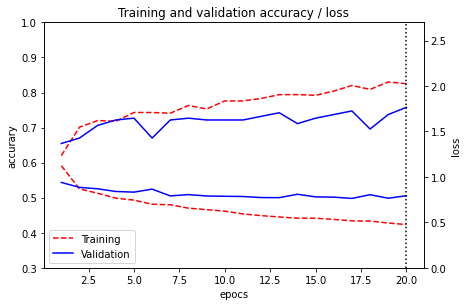

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=2.7)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

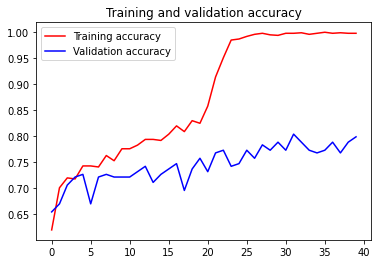

<Figure size 432x288 with 0 Axes>

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy2(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  #loss = history.history['loss']
  #val_loss = history.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'r', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend(loc=0)
  plt.figure()
  plt.show()

show_accuracy2(H)

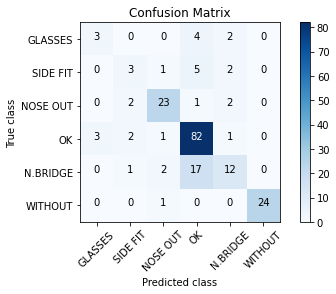

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)
my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

## Do a round of fine-tuning of the entire model

Finally, let's unfreeze the base model and train the entire model end-to-end with a low
 learning rate.

Importantly, although the base model becomes trainable, it is still running in
inference mode since we passed `training=False` when calling it when we built the
model. This means that the batch normalization layers inside won't update their batch
statistics. If they did, they would wreck havoc on the representations learned by the
 model so far.

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
base_model.trainable = True
#model.summary()
EPOCHS = 20
INIT_LR = 1e-5

model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H2 = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)
#Concatenamos historia de entrenamiento
H.history['loss'] = H.history['loss'] + H2.history['loss']
H.history['accuracy'] = H.history['accuracy'] + H2.history['accuracy']
H.history['val_loss'] = H.history['val_loss'] + H2.history['val_loss']
H.history['val_accuracy'] = H.history['val_accuracy'] + H2.history['val_accuracy']

accuracy:  147 / 194  =  0.7577319587628866
Epoch 1/20
31/31 [==============================] - 472s 14s/step - loss: 0.4177 - accuracy: 0.8580 - val_loss: 0.7655 - val_accuracy: 0.7320
Epoch 2/20
31/31 [==============================] - 426s 14s/step - loss: 0.2534 - accuracy: 0.9140 - val_loss: 0.7451 - val_accuracy: 0.7680
Epoch 3/20
31/31 [==============================] - 427s 14s/step - loss: 0.1631 - accuracy: 0.9510 - val_loss: 0.7729 - val_accuracy: 0.7732
Epoch 4/20
31/31 [==============================] - 435s 14s/step - loss: 0.0862 - accuracy: 0.9850 - val_loss: 0.8884 - val_accuracy: 0.7423
Epoch 5/20
31/31 [==============================] - 430s 14s/step - loss: 0.0558 - accuracy: 0.9870 - val_loss: 0.9030 - val_accuracy: 0.7474
Epoch 6/20
31/31 [==============================] - 433s 14s/step - loss: 0.0436 - accuracy: 0.9920 - val_loss: 0.8976 - val_accuracy: 0.7732
Epoch 7/20
31/31 [==============================] - 443s 14s/step - loss: 0.0228 - accuracy: 0.9960 - va

acc:  [0.6200000047683716, 0.7009999752044678, 0.7200000286102295, 0.7179999947547913, 0.7429999709129333, 0.7429999709129333, 0.7409999966621399, 0.7630000114440918, 0.753000020980835, 0.7760000228881836, 0.7760000228881836, 0.7829999923706055, 0.7940000295639038, 0.7940000295639038, 0.7919999957084656, 0.8040000200271606, 0.8199999928474426, 0.8090000152587891, 0.8299999833106995, 0.824999988079071, 0.8579999804496765, 0.9139999747276306, 0.9509999752044678, 0.9850000143051147, 0.9869999885559082, 0.9919999837875366, 0.9959999918937683, 0.9980000257492065, 0.9950000047683716, 0.9940000176429749, 0.9980000257492065, 0.9980000257492065, 0.9990000128746033, 0.9959999918937683, 0.9980000257492065, 1.0, 0.9980000257492065, 0.9990000128746033, 0.9980000257492065, 0.9980000257492065]
val_acc:  [0.6546391844749451, 0.6701030731201172, 0.7061855792999268, 0.7216494679450989, 0.7268041372299194, 0.6701030731201172, 0.7216494679450989, 0.7268041372299194, 0.7216494679450989, 0.7216494679450989,

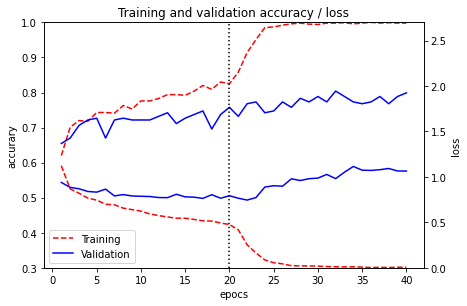

In [ ]:
show_accuracy(H)

              precision    recall  f1-score   support

     GLASSES       0.57      0.44      0.50         9
    SIDE FIT       0.60      0.55      0.57        11
    NOSE OUT       0.86      0.86      0.86        28
          OK       0.85      0.85      0.85        89
    N.BRIDGE       0.58      0.66      0.62        32
     WITHOUT       1.00      0.96      0.98        25

    accuracy                           0.80       194
   macro avg       0.74      0.72      0.73       194
weighted avg       0.80      0.80      0.80       194



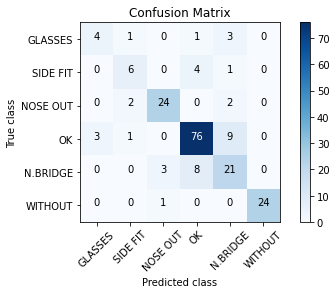

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from sklearn.metrics import classification_report

validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

Found 194 images belonging to 6 classes.


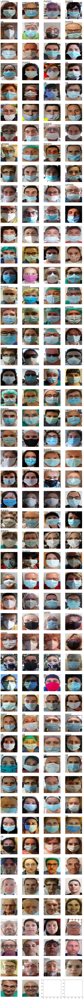

accuracy:  155 / 194  =  0.7989690721649485


In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }
import numpy as np
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

NCOLS = 4 # número de columnas

#Visualiza los pimeros <number> imagenes, generadas desde datagen
#se clasifica cada imagen y en caso de error, se muestra la categoría asignada 
def show_generate_images(datagen, sample_number=None):
   if not isinstance(sample_number, (int) ): # Si no se indican cuantas 
      sample_number = datagen.samples        # se visualizan todas
   target_names = []                 # Obtenemos nombres de las clases 
   for key in datagen.class_indices:
      target_names.append(key)  
   nrows = -(-sample_number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))
   errors = 0
   i = 0
   for b in range( -(-sample_number // datagen.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
      x,y = datagen.next()
      for j in range(len(x)):
         if (i < sample_number):
            col = i % NCOLS
            row = i // NCOLS
            ax[row,col].axis('Off')  
            ax[row,col].imshow(x[j])
            y_pred = model.predict(x)[j]  # Verificamos error
            cat = np.argmax(y[j])
            cat_pred = np.argmax(y_pred) 
            if cat != cat_pred :
                ax[row,col].text(0, 0, target_names[cat_pred], fontsize=22)
                errors +=1
            i += 1
   plt.show()
   print("accuracy: ", sample_number-errors,"/",sample_number," = ", (sample_number-errors)/sample_number ) 

validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+"/validation/",
    batch_size=BATCH_SIZE,
	  target_size=(IMG_SIZE),
    shuffle=False)
validation_generator.reset()
show_generate_images(validation_generator)
